In [92]:
import random

import cv2
from matplotlib import pyplot as plt

import albumentations as A
def visualize(image):
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)


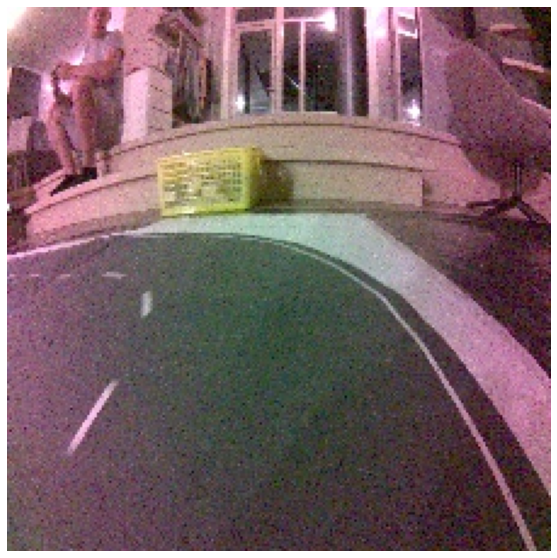

In [93]:
image = cv2.imread('dataset_xy/xy_-01_100_1976b074-033d-11eb-89e4-16f63a1aa8c9.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
visualize(image)

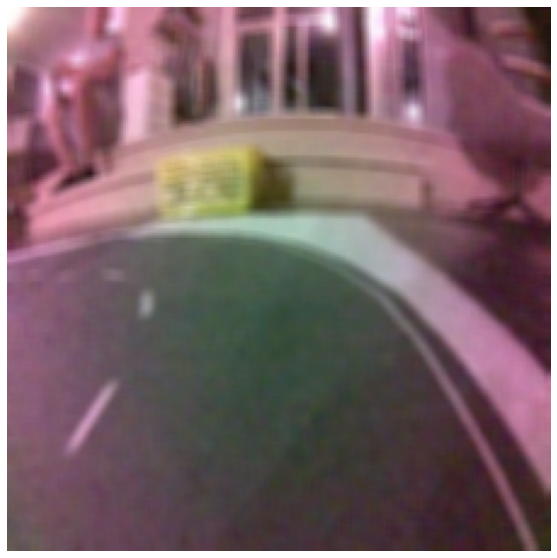

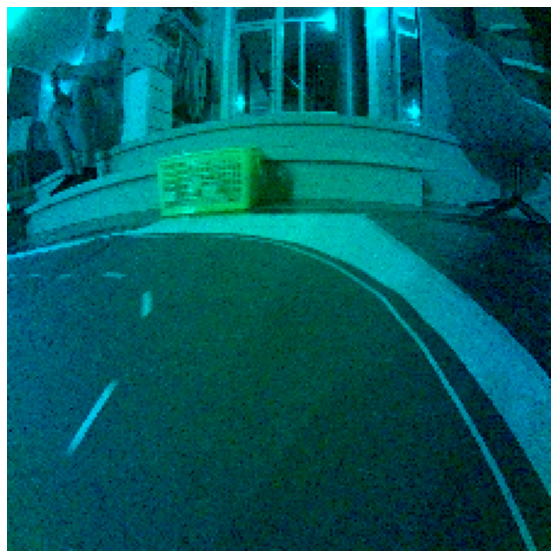

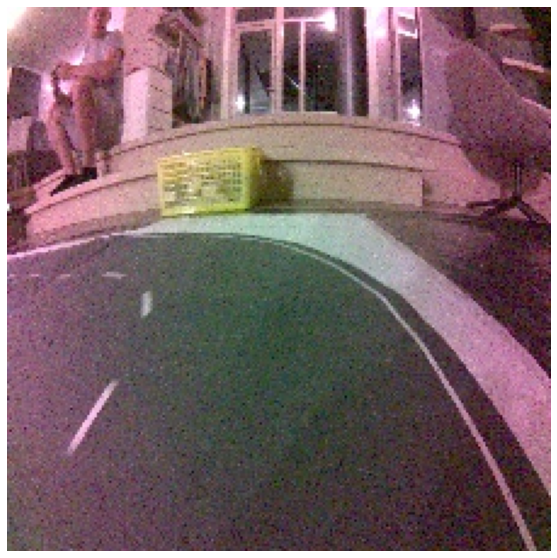

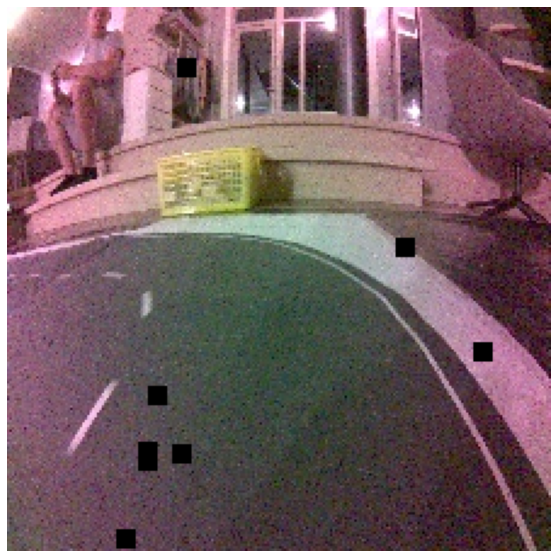

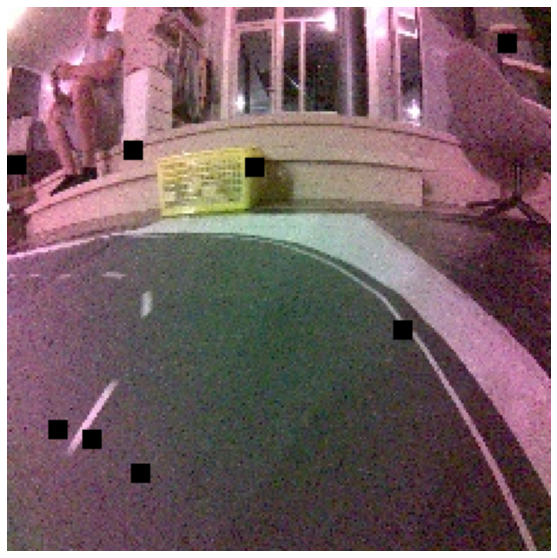

...

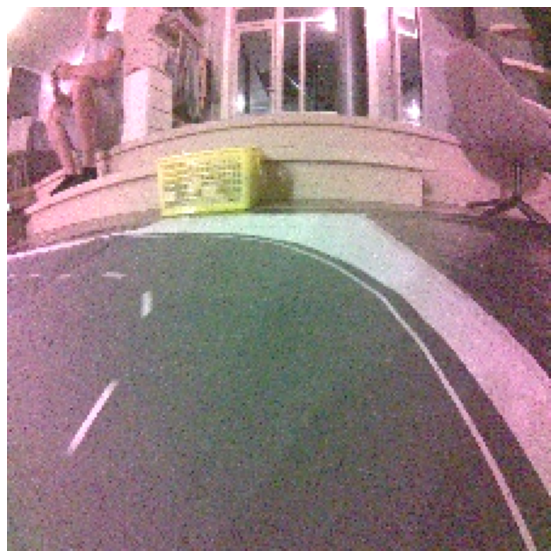

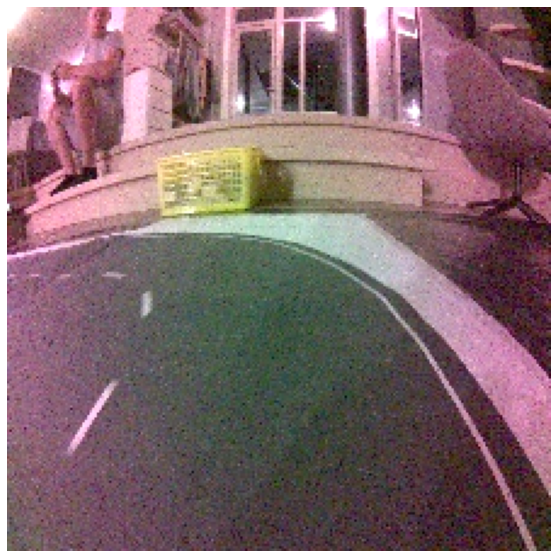

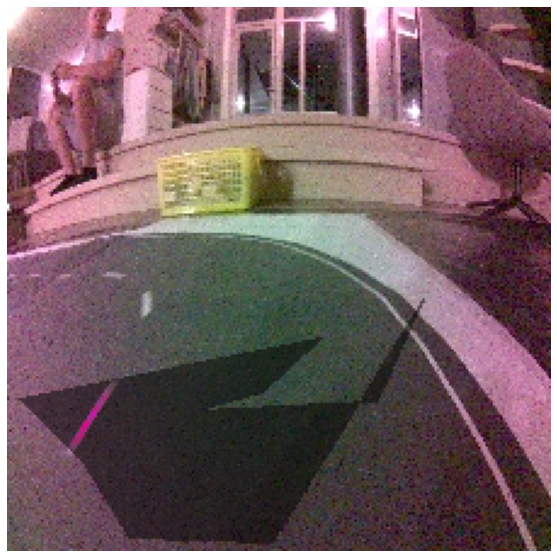

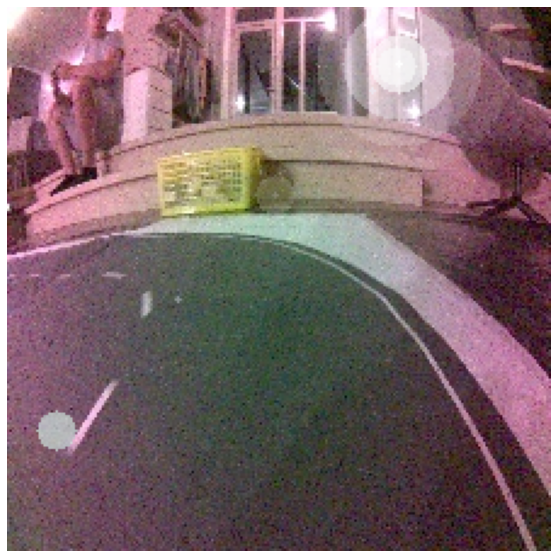

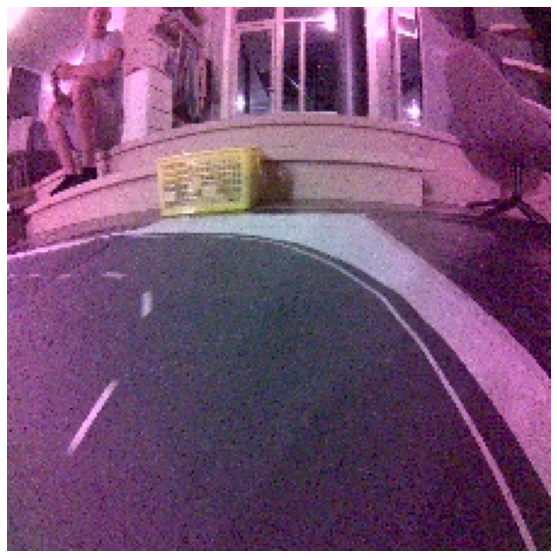

In [95]:
for tr in transforms:
    
    transform = tr
#             print(newpath)
    augmented_image = transform(image=image)['image']
    visualize(augmented_image)

In [89]:

import os
from pathlib import Path

directory = "dataset_xy"
#         print(entry.path)
# transform = A.GlassBlur(sigma = 0.5, iterations =1) # not sure
# transform = A.ChannelShuffle()
# transform = A.ChannelShuffle(always_apply=True)
# transform = A.Cutout()
transforms = [A.Blur(always_apply=True), A.ChannelDropout(always_apply=True),  A.ChannelShuffle(always_apply=True), A.CoarseDropout(always_apply=True), A.Cutout(always_apply=True), A.GaussianBlur(blur_limit=(3, 21), always_apply=True), A.GaussNoise(var_limit=(10.0, 300.0), always_apply=True), A.GridDistortion(always_apply=True), A.HueSaturationValue(hue_shift_limit=40, sat_shift_limit=40, val_shift_limit=40, always_apply=True), A.ImageCompression(quality_lower=1, always_apply=True), A.ISONoise(color_shift=(0.01, 0.40), intensity=(0.1, 0.6), always_apply=True, p=0.5), A.MotionBlur(always_apply=True), A.OpticalDistortion(always_apply=True), A.RandomBrightnessContrast(always_apply=True), A.RandomContrast(limit=0.6, always_apply=True), A.RandomShadow(always_apply=True), A.RandomSunFlare(src_radius=80, always_apply=True), A.RGBShift(always_apply=True)]
#for each transform type
#    for each file in dataset Dir
newpath = "Augmentation"
for entry in os.scandir(directory):
    if (entry.path.endswith(".jpg")
        or entry.path.endswith(".png")) and entry.is_file():
#         print(entry.name)
        for tr in transforms:
            newpath = "Augmentation"
            newpath = newpath + "/" + str(tr).split("(")[0]
            if not os.path.exists(newpath):
                os.makedirs(newpath)
            newpath = newpath + "/" + entry.name
            transform = tr
#             print(newpath)

            image = cv2.imread(entry.path)
            augmented_image = transform(image=image)['image']
            cv2.imwrite(newpath, augmented_image) 

        
        
        

#     visualize(augmented_image)



# # random.seed(7)
# augmented_image = transform(image=image)['image']

# visualize(augmented_image)